In [1]:
%matplotlib inline
from matplotlib import pyplot as plt
import seaborn as sns
import numpy as np
import pandas as pd
import skimage.io as io
import sys
import os
sys.path.append('../')
import helpers.histogram_classifier as hc

In [2]:
test_labels = np.load("../models/features_3/test_labels")

In [3]:
predicted_labels = np.load("../models/features_3/predicted_labels")

In [4]:
classes = pd.read_csv('../data/food-101/meta/top_classes.csv', index_col=0)
class_list = list(classes['class'].unique())

image_names = {}
for c in class_list:
    image_names[c] = np.array(classes[classes['class'] == c]['name'])

In [5]:
from IPython.core.display import HTML
css = open('styles/table-style.css').read() #+ open('style-notebook.css').read()
HTML('<style>{}</style>'.format(css))

In [6]:
overall, metrics, confusion = hc.get_metrics(test_labels, predicted_labels, class_list)

In [7]:
confusion

,pork_chop,lasagna,french_toast,guacamole,apple_pie,cheesecake,hamburger,fried_rice,carrot_cake,chocolate_cake,steak,pizza
pork_chop,73,16,11,14,5,11,10,18,11,19,52,10
lasagna,16,53,20,24,24,12,7,28,10,8,7,41
french_toast,17,22,70,12,17,7,15,25,11,7,18,29
guacamole,13,6,4,79,11,17,18,39,14,9,16,24
apple_pie,7,15,10,21,35,49,31,26,17,8,8,23
cheesecake,5,4,2,14,19,126,7,6,15,39,7,6
hamburger,17,11,11,26,22,23,58,22,7,16,20,17
fried_rice,9,8,7,28,12,13,8,115,8,1,6,35
carrot_cake,23,10,17,22,19,41,11,16,41,15,17,18
chocolate_cake,16,2,13,12,3,41,13,1,10,91,42,6


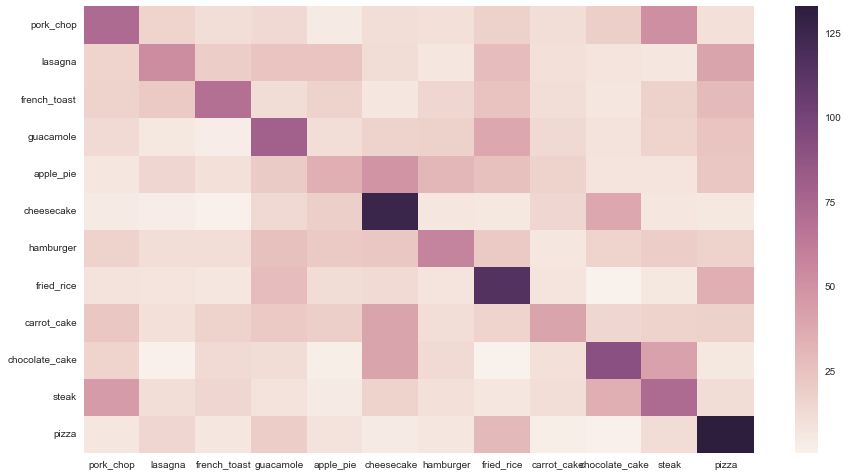

In [8]:
fig, ax = plt.subplots(figsize=(15,8))
sns.heatmap(confusion)
plt.show()

Some of the most obvious confused classes are:
- Pork and steak being confused with each other
- Carrot cake and chocolate cake being confused with cheesecake

In [9]:
test_data = np.load("../models/features_3/test_data")

In [10]:
df = pd.DataFrame(test_data, columns=['actual_label', 'predicted_label', 'image_name'])

In [11]:
df.head(5)

,actual_label,predicted_label,image_name
0,pork_chop,steak,3826314.jpg
1,pork_chop,pizza,1100057.jpg
2,pork_chop,steak,2160496.jpg
3,pork_chop,lasagna,816441.jpg
4,pork_chop,pork_chop,2211393.jpg


Some pork chops accurately classified as pork chop

In [12]:
images = list(df[(df['actual_label'] == 'pork_chop') & (df['predicted_label'] == 'pork_chop')].head(5)['image_name'])

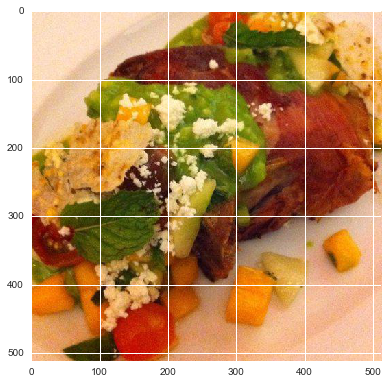

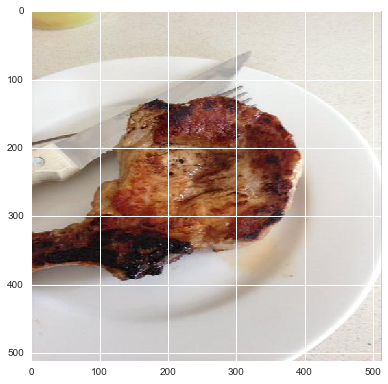

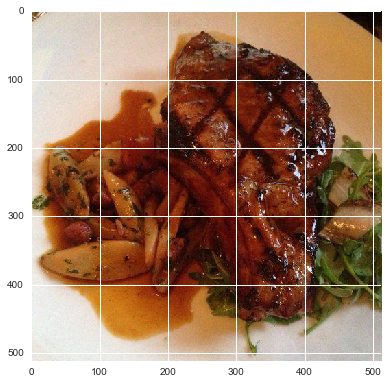

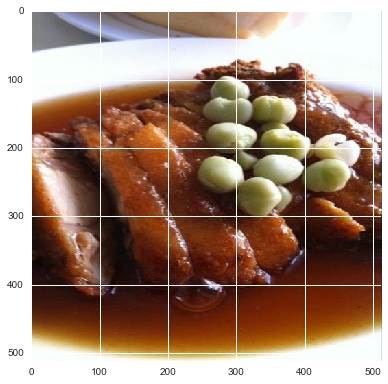

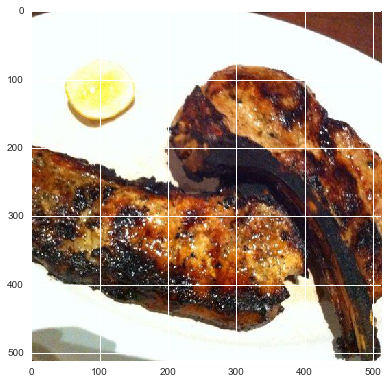

In [13]:
for i in images:
    io.imshow(os.path.join("../data/food-101/top_classes/pork_chop/", i))
    io.show()

Pork chops classified as steaks

In these examples, the lighting of the actual meat is generally darker.

In [14]:
images = list(df[(df['actual_label'] == 'pork_chop') & (df['predicted_label'] == 'steak')].head(5)['image_name'])

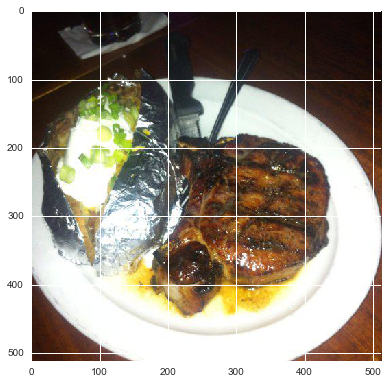

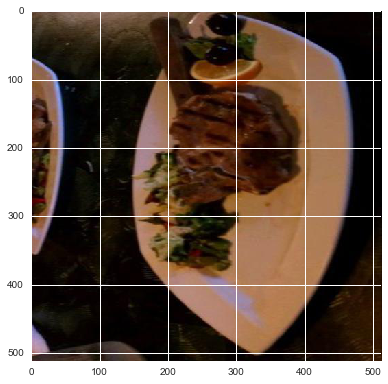

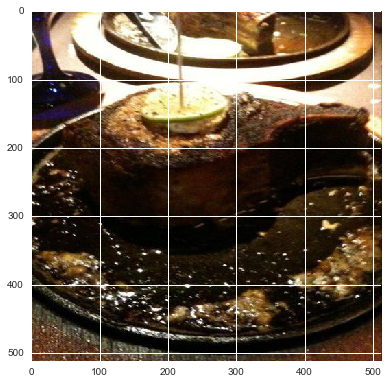

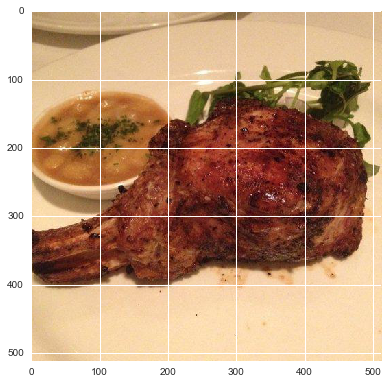

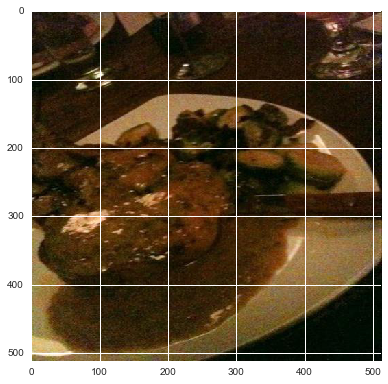

In [15]:
for i in images:
    io.imshow(os.path.join("../data/food-101/top_classes/pork_chop/", i))
    io.show()

Steaks classified as steaks

Interestingly, in this set of 5 images there is a picture which is not even of food. It may be that the colors of the wood and carpet are similar enough to the colors of cooked steak.

In [16]:
images = list(df[(df['actual_label'] == 'steak') & (df['predicted_label'] == 'steak')].head(5)['image_name'])

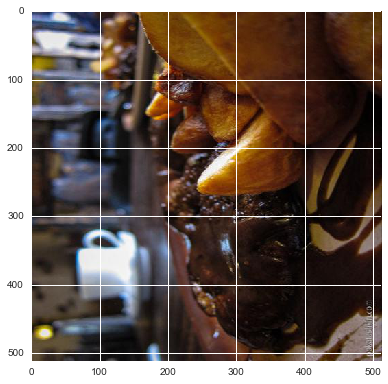

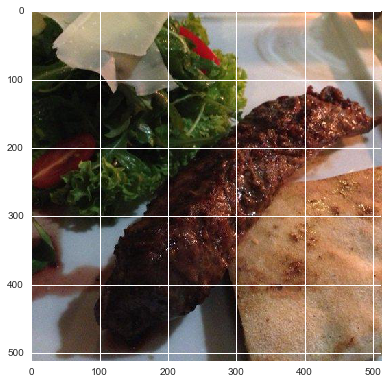

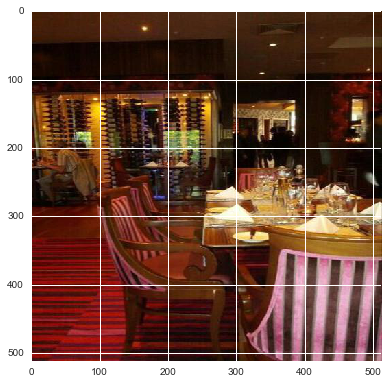

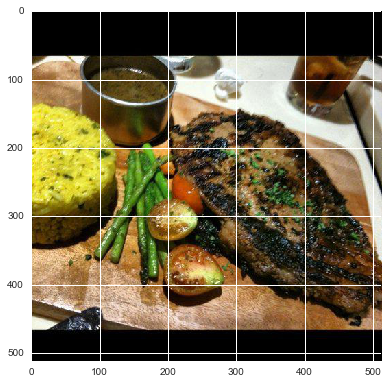

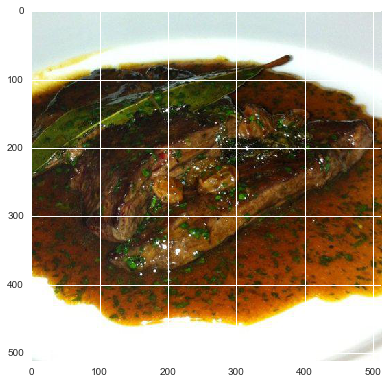

In [17]:
for i in images:
    io.imshow(os.path.join("../data/food-101/top_classes/steak/", i))
    io.show()

Steaks classified as pork chops

In [18]:
images = list(df[(df['actual_label'] == 'steak') & (df['predicted_label'] == 'pork_chop')].head(5)['image_name'])

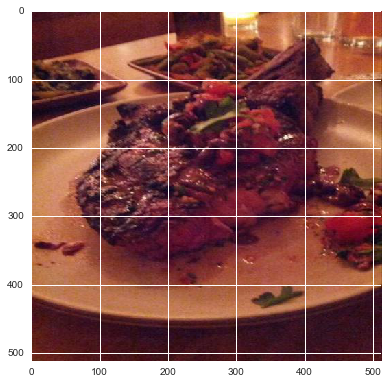

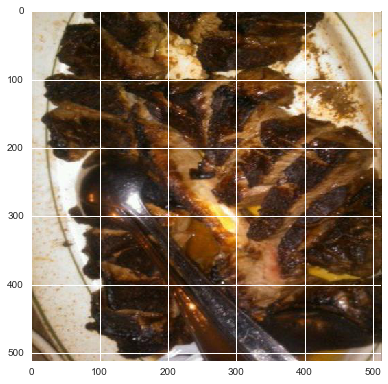

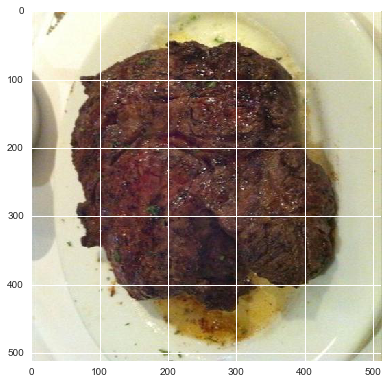

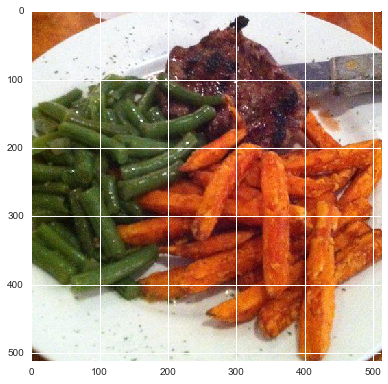

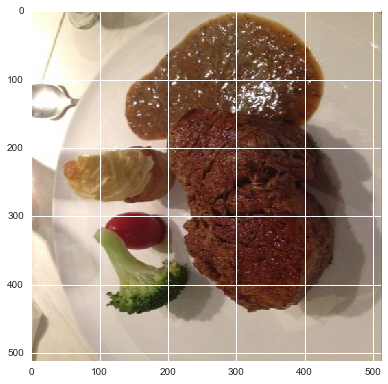

In [19]:
for i in images:
    io.imshow(os.path.join("../data/food-101/top_classes/steak/", i))
    io.show()

In general, it is not surprising that differentiating between steak and pork is hard, as a cooked pork chop can look very similar to a cooked pieces of steak.

Similarly, it is not so surprising that it is hard to distinguish between the three categories of cake.

Carrot cake correctly classified

In [23]:
images = list(df[(df['actual_label'] == 'carrot_cake') & (df['predicted_label'] == 'carrot_cake')].head(5)['image_name'])

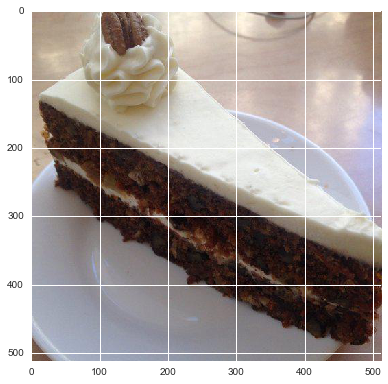

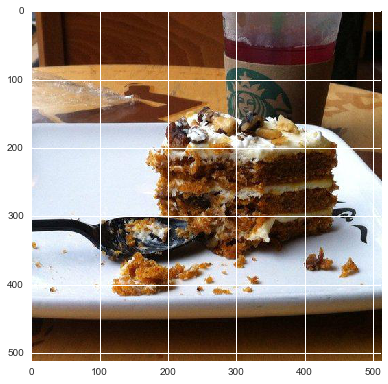

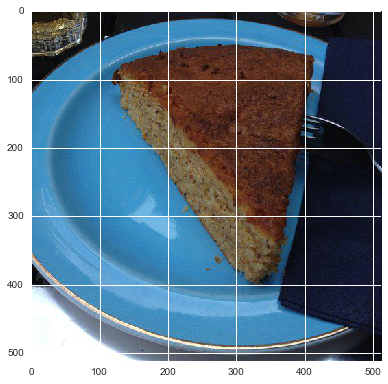

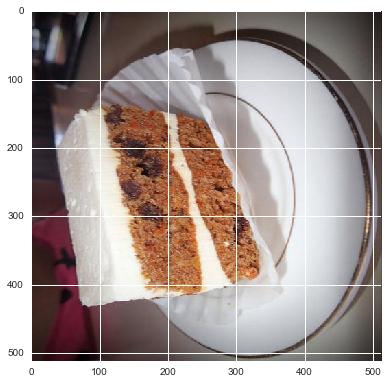

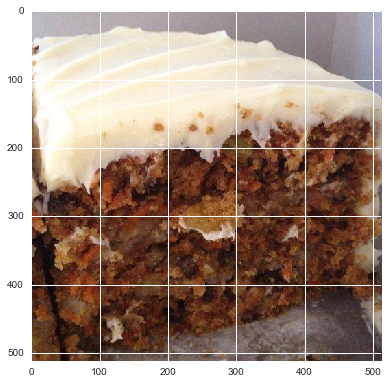

In [25]:
for i in images:
    io.imshow(os.path.join("../data/food-101/top_classes/carrot_cake/", i))
    io.show()

Cheesecake correctly classified

In [26]:
images = list(df[(df['actual_label'] == 'cheesecake') & (df['predicted_label'] == 'cheesecake')].head(5)['image_name'])

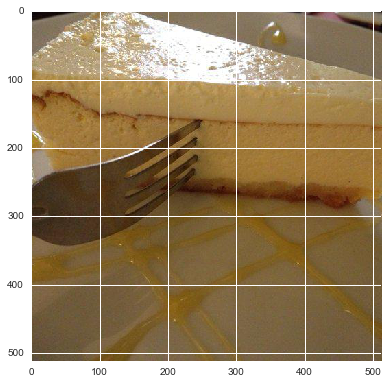

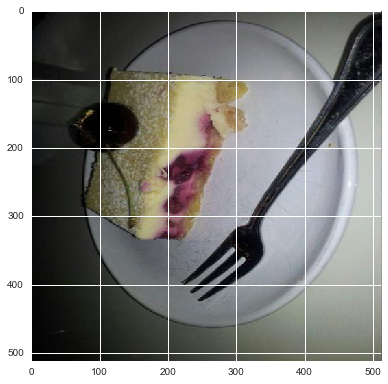

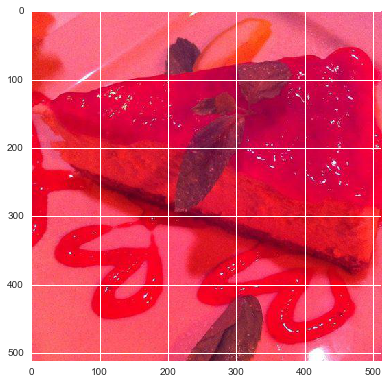

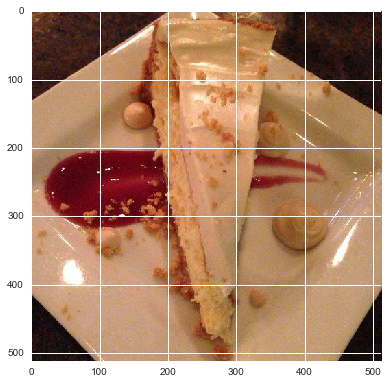

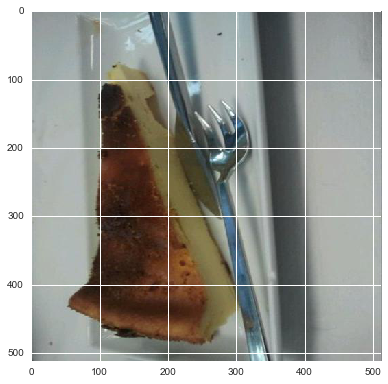

In [27]:
for i in images:
    io.imshow(os.path.join("../data/food-101/top_classes/cheesecake/", i))
    io.show()

Carrot cake classified as cheesecake

In [28]:
images = list(df[(df['actual_label'] == 'carrot_cake') & (df['predicted_label'] == 'cheesecake')].head(5)['image_name'])

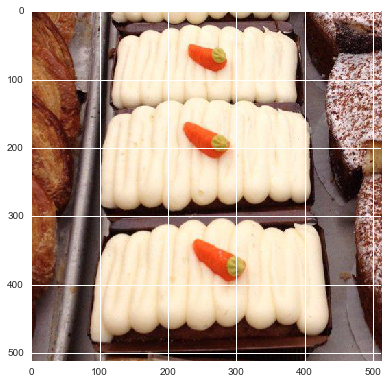

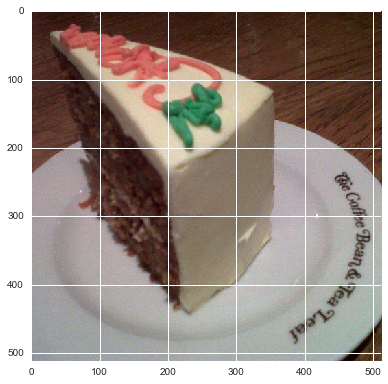

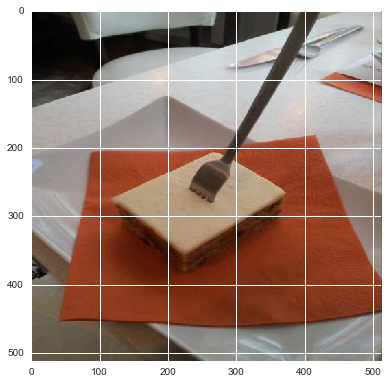

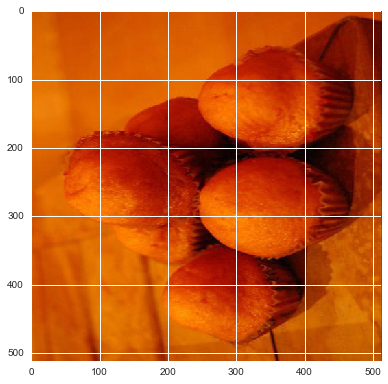

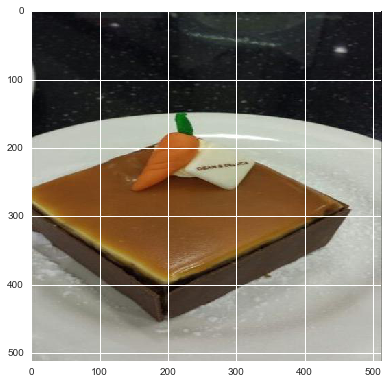

In [30]:
for i in images:
    io.imshow(os.path.join("../data/food-101/top_classes/carrot_cake/", i))
    io.show()